#outline of this notebook:

In this notebook the model is trained with all the samples.

1. we can visualize the a2d2 dataset and the redifined labels of the traffic signals.

2. Train the model or load the fine tuned model perform the inference with two approches (i.e, standard inference and Mc-dropout based) on the clean data and augmented data.

3. The model performace is evaluated with Intersection of Union and Shanon's entropy to estimate uncertainity:
       $$\mathcal{H} \mathbf{(p) = -{\sum_{i=1}^{n}\mathbf{p_ilog(p_i)}}}$$

In [1]:
# !git clone https://github.com/VainF/DeepLabV3Plus-Pytorch.git

In [1]:
import sys, os
import time
from PIL import Image
import torch
import torch.nn as nn
import numpy as np  
from torch.utils.data import DataLoader, Subset
sys.path.append('data_utils')
from data_utils.dataloader import A2d2dataset
from data_utils.utils import train_val_test
from train import train_step
from test import test_predictions, mcd_pred
from metrics import iou_metric, entropy
from torchvision.transforms import transforms
import matplotlib.pyplot as plt
sys.path.append('DeepLabV3Plus-Pytorch')
import network

#### Data preprocessing  

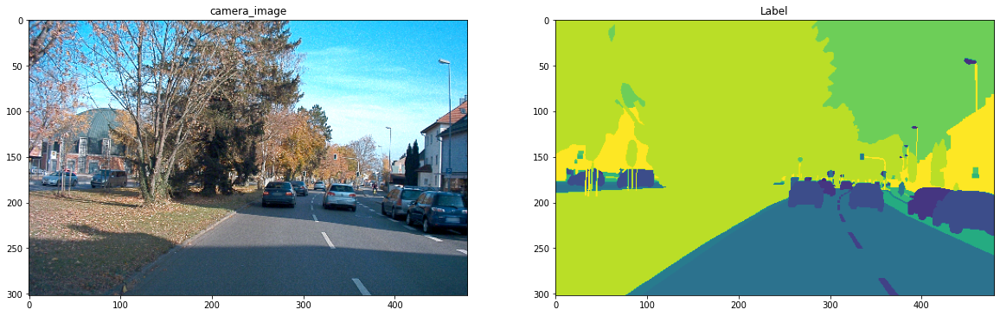

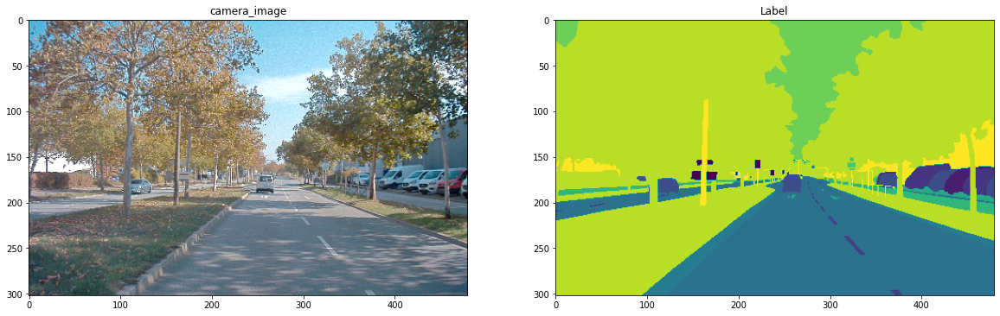

In [2]:
path_to_data = 'a2d2_compressed'
transform = transforms.Compose([transforms.ToTensor()])
complete_dataset = A2d2dataset(root = 'a2d2_compressed', image_folder= 'images', labels_folder= 'labels',transforms= transform)
dataloader = DataLoader(complete_dataset, batch_size = 16, shuffle= True)

images, labels = next(iter(dataloader))
for i in range(2):
    fig, ax = plt.subplots(1, 2, figsize = (20, 20))
    ax[0].imshow(images[i].squeeze(0).numpy().transpose(1,2,0))
    ax[0].set_title('camera_image')
    ax[1].imshow(labels[i].numpy().transpose(1,2,0))          
    ax[1].set_title('Label')
    plt.savefig('dataset_samples.png')

Dataset after masking and filtering only traffic signals I created a folder which has newly defined labels which contains only traffic signs 

--------------------- Total number of samples: 5000 samples -------------------------


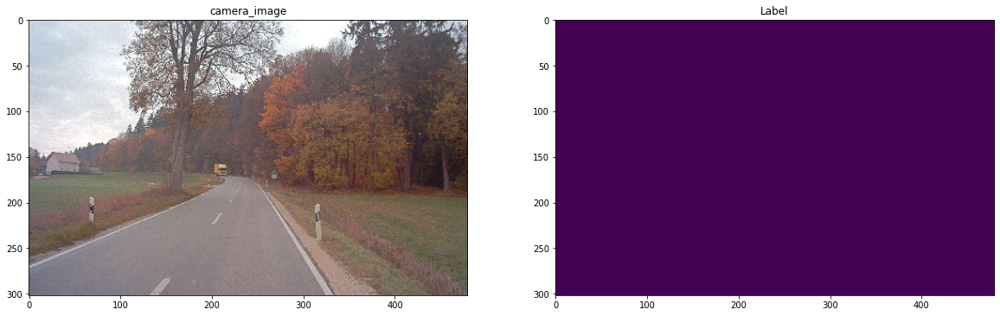

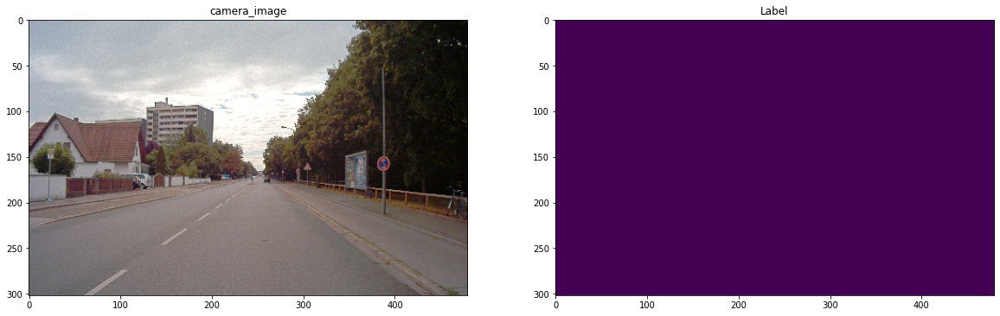

In [11]:
a2d2_dataset = A2d2dataset(root = 'a2d2_compressed', image_folder= 'images', labels_folder= 'binary_labels',transforms= transform)
print('--------------------- Total number of samples: ' + str(len(a2d2_dataset)) + ' samples -------------------------' )
split_dataset = train_val_test(dataset= a2d2_dataset)

train_dataloader = DataLoader(split_dataset['train'], batch_size = 16, shuffle= True)
valid_dataloader = DataLoader(split_dataset['val'], batch_size = 16, shuffle= False)
test_dataloader = DataLoader(split_dataset['test'], batch_size = 16, shuffle= False)

images, labels = next(iter(train_dataloader))
for i in range(2):
    fig, ax = plt.subplots(1, 2, figsize = (20, 20))
    ax[0].imshow(images[i].squeeze(0).numpy().transpose(1,2,0))
    ax[0].set_title('camera_image')
    ax[1].imshow(labels[i].numpy().transpose(1,2,0))
    ax[1].set_title('Label')


#### Model Definition

Load the adopted Deepv3plus model and the weights for my training I have taken mobilenet based model computationally faster.


modification to the model:
    1. Added a dropout layer and modified the last layer depending on the number of classes.
    2. training only the classfication part of the model.


In [4]:
model = network.modeling.__dict__['deeplabv3plus_mobilenet'](num_classes=19, output_stride=16)   ###Adopted from the Deeplabveplus ####
model.load_state_dict(torch.load('trained_model/best_deeplabv3plus_mobilenet_cityscapes_os16.pth')["model_state"])  #

# freeze the backbone model parameters
for params in model.backbone.parameters():
    params.requires_grad = False

# Added a dropout layer in the classifier model to perform uncertainty estimation during inference time (MC-dropout)
model.classifier.project = model.classifier.project.append(nn.Dropout(p = 0.3,inplace= False))

#modeified the last layer depending on our number of classes
model.classifier.classifier[-1] =  torch.nn.Conv2d(in_channels= 256, out_channels= 1, kernel_size= (1, 1), stride= (1,1))

##### Model training 

The model is trained for 15 epochs with the learning rate of 1e-3
using the Binary cross entropy  as a loss function with Adam optimizer

In [5]:
total_epochs = 15
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)
learning_rate = 1e-3
loss_function = torch.nn.BCELoss()
optimizer = torch.optim.Adam(model.parameters(), lr = learning_rate)

-----training done, valdiating-----
epoch: 0/15, traning_loss :0.052983, validation_loss :0.005350
-----training done, valdiating-----
epoch: 1/15, traning_loss :0.003548, validation_loss :0.002567
-----training done, valdiating-----
epoch: 2/15, traning_loss :0.001978, validation_loss :0.001670
-----training done, valdiating-----
epoch: 3/15, traning_loss :0.001396, validation_loss :0.001283
-----training done, valdiating-----
epoch: 4/15, traning_loss :0.001165, validation_loss :0.001119
-----training done, valdiating-----
epoch: 5/15, traning_loss :0.001026, validation_loss :0.001055
-----training done, valdiating-----
epoch: 6/15, traning_loss :0.000883, validation_loss :0.000995
-----training done, valdiating-----
epoch: 7/15, traning_loss :0.000780, validation_loss :0.000986
-----training done, valdiating-----
epoch: 8/15, traning_loss :0.000726, validation_loss :0.001060
-----training done, valdiating-----
epoch: 9/15, traning_loss :0.000690, validation_loss :0.000845
-----train

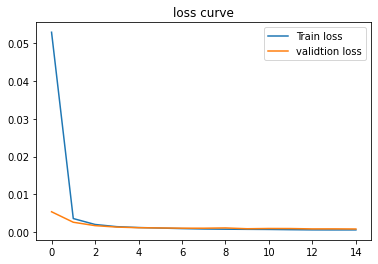

In [8]:
training_loss, validation_loss = train_step(model, train_dataloader, valid_dataloader, total_epochs, loss_function, optimizer, device)
plt.plot(range(total_epochs), training_loss, label = 'Train loss')
plt.plot(range(total_epochs), validation_loss, label = 'validtion loss')
plt.title('loss curve')
plt.legend()
plt.savefig('training_losscurve_completedata.png', dpi = 200)

##### Load the trained and saved model parameters

In [12]:
model.load_state_dict(torch.load('trained_model/new_model_weights_dropout_04.pth'))

<All keys matched successfully>

### Inference on the test dataset:

Perform two diffrence inference tecnique:
1. standard inference (considered as a baseline)
2. Monte-Carlo dropout : perform multiple forward passes by enabling dropout during inference time (would be a stochastic process), and the final prediction is the average of all the predictions. 
     
In the Plot we can see the image, label, model prediction and the uncertainty map

In [13]:
overall_iou = 0.0
with torch.no_grad(): 
    for idx, (images, labels) in enumerate(test_dataloader):
        images = images.float().to(device)
        labels = labels.float().to(device)
        predicted = model(images)
        predicted =torch.sigmoid(predicted).cpu().numpy()
        iou = iou_metric(predicted, labels.cpu().numpy())
    overall_iou += iou.item()
print('overall_iou on test data', overall_iou)

overall_iou on test data 0.3633222464011402


iou 1.0
time taken: 0.6845118999481201
iou 1.0
time taken: 0.16309189796447754
iou 0.7427536254402436
time taken: 0.7032485008239746
iou 0.7436670709986744
time taken: 0.1495048999786377
iou 1.0
time taken: 0.7545127868652344
iou 1.0
time taken: 0.1476900577545166
iou 1.0
time taken: 0.7700963020324707
iou 1.0
time taken: 0.14686274528503418
iou 1.0
time taken: 0.7772784233093262
iou 1.0
time taken: 0.14752483367919922


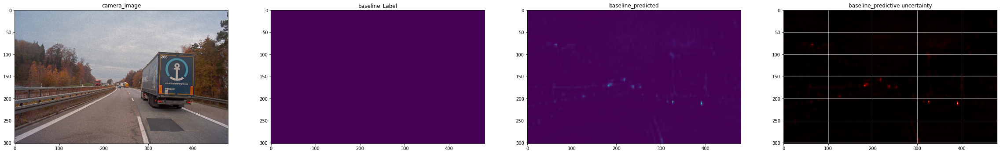

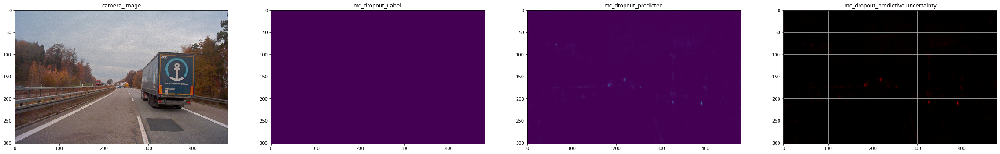

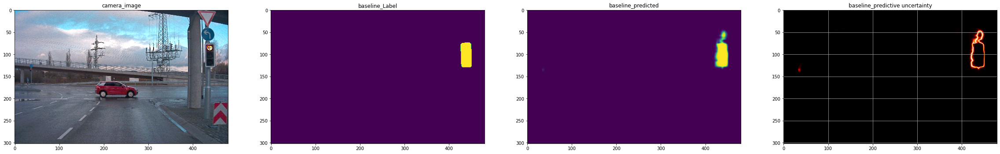

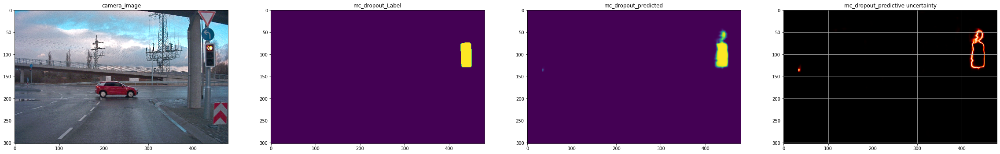

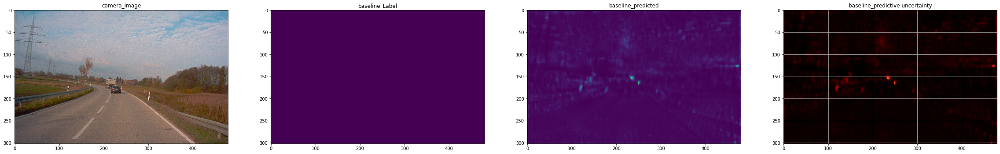

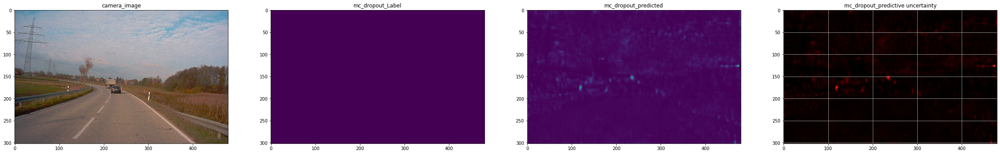

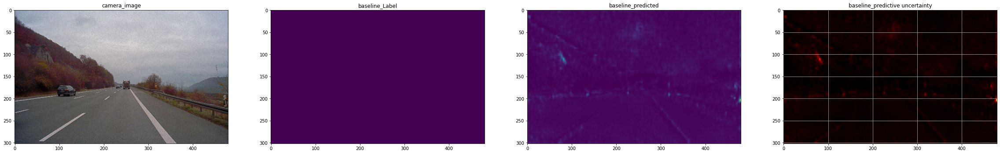

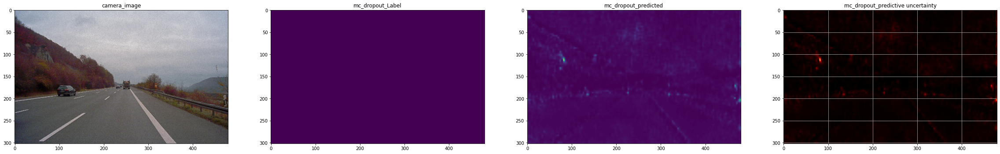

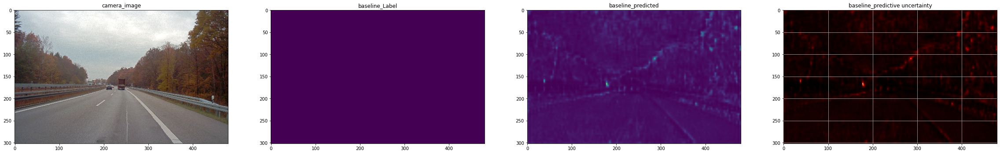

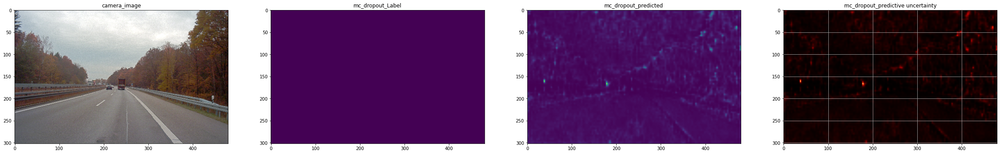

In [14]:
test_images, test_labels = next(iter(test_dataloader))
for i in range(5):
    predicted, entropy_ = test_predictions(model, test_images[i], test_labels[i], device)
    average_pred, entropy_ = mcd_pred(model, test_images[i], test_labels[i], device, forward_passes= 5)  


#### Augment the test data and perform inference

iou 1.0
time taken: 0.7431421279907227
iou 1.0
time taken: 0.28967785835266113
iou 0.8339273003616464
time taken: 0.8268024921417236
iou 0.8188202265634705
time taken: 0.2932302951812744
iou 1.0
time taken: 0.698516845703125
iou 1.0
time taken: 0.29261040687561035
iou 1.0
time taken: 0.838193416595459
iou 1.0
time taken: 0.2942018508911133
iou 1.0
time taken: 0.884314775466919
iou 1.0
time taken: 0.29427409172058105


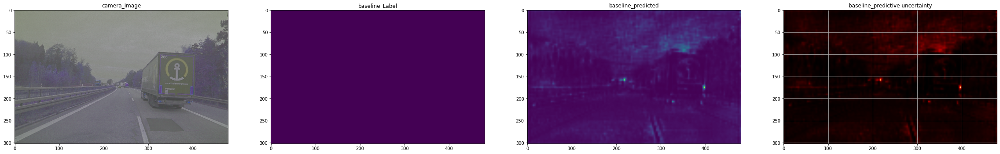

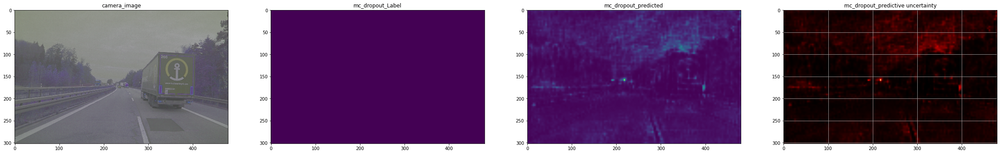

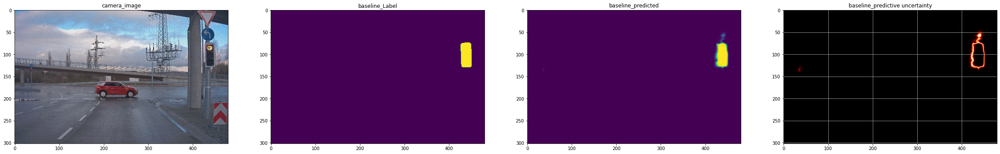

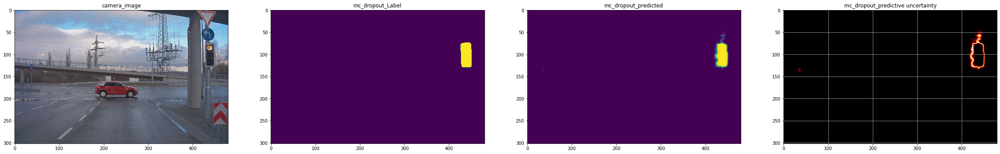

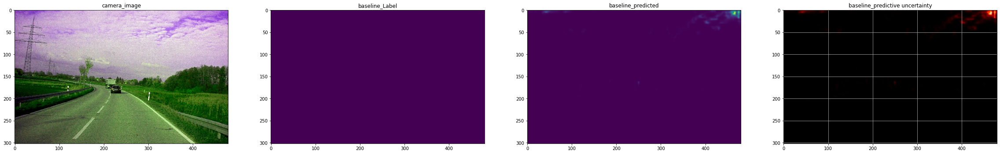

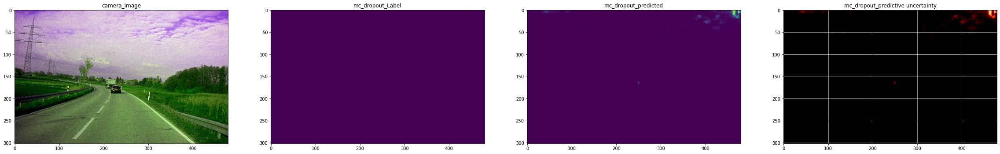

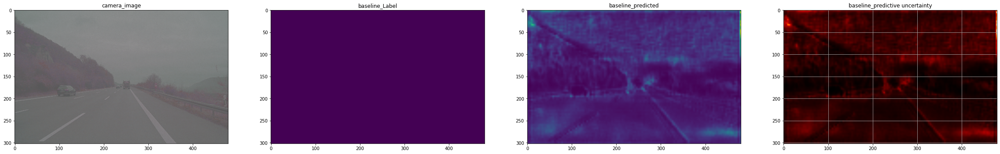

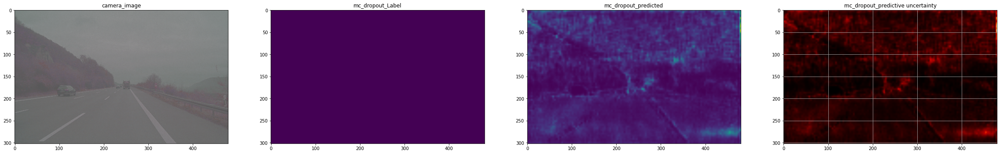

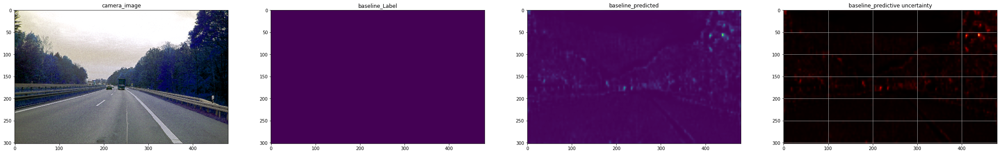

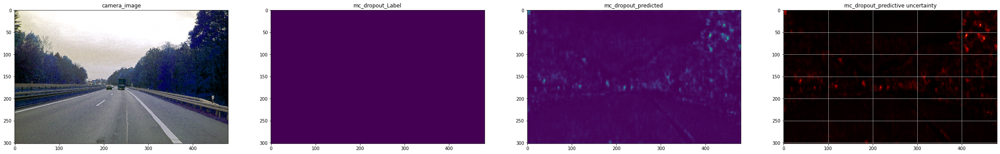

In [15]:
jitter = transforms.Compose([transforms.ToPILImage(), transforms.ColorJitter(hue = 0.5, contrast= 0.8), transforms.ToTensor()])
for i in range(5):
    augment_img = jitter(test_images[i])
    predicted, entropy_ = test_predictions(model, augment_img, test_labels[i], device)
    average_pred, entropy_ = mcd_pred(model, augment_img, test_labels[i], device, 10)